# Chapter 11 Image Restore and Super Resolution

## Generate an image

In [1]:
# prepare a image
import torch
from diffusers import StableDiffusionPipeline

text2img_pipe = StableDiffusionPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
    , safety_checker = None
).to("cuda:0")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\transformers\models\clip\feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers

  0%|          | 0/50 [00:00<?, ?it/s]

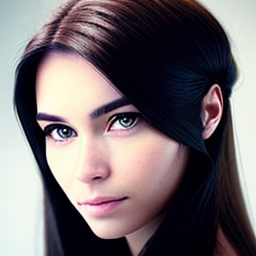

Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, due to the lack of support for`float16` operations on this device in PyTorch. Please, remove the `torch_dtype=torch.float16` argument, or use another device for inference.
Pipelines loaded with `dtype=torch.float16` cannot run with `cpu` device. It is not recommended to move them to `cpu` as running them will fail. Please make sure to use an accelerator to run the pipeline in inference, du

In [2]:
# Generate the initial image 
prompt = """
a realistic photo of beautiful woman face
"""
neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(3)
).images[0]
display(raw_image)

text2img_pipe.to("cpu")
torch.cuda.empty_cache()

In [3]:
# Save the image
image_name = "woman_face"
file_name_256x256 = f"input_images/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

## Upscale image using Img-to-Img Diffusion

C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


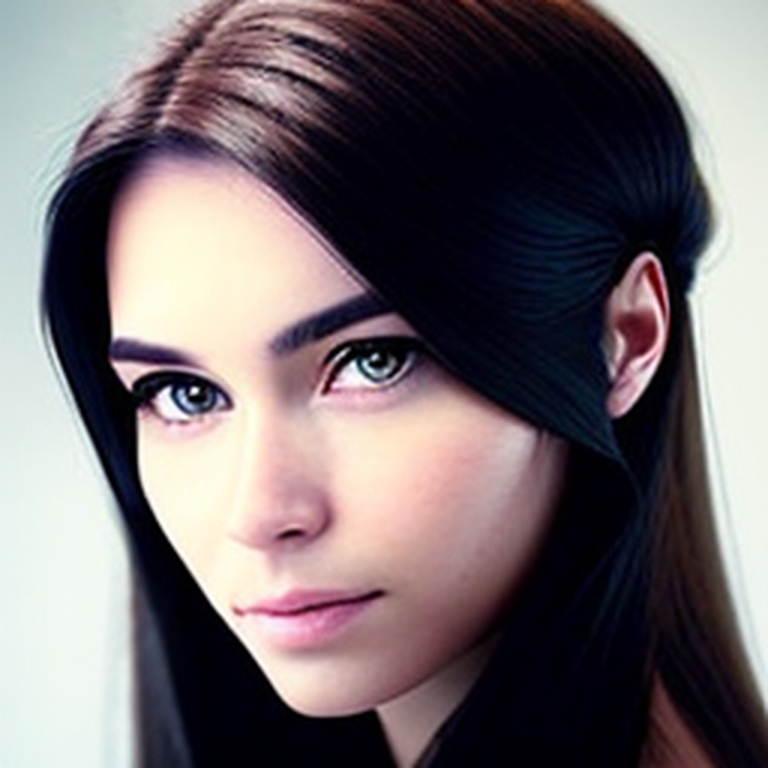

In [5]:
# resize image
from diffusers.utils import load_image
from PIL import Image

def get_width_height(width, height):
    width = (width//8)*8
    height = (height//8)*8
    return width,height 

def resize_img(img_path,upscale_times):
    img             = load_image(img_path)
    if upscale_times <=0:
        return img
    width,height    = img.size
    width           = width * upscale_times
    height          = height * upscale_times
    width,height    = get_width_height(int(width),int(height))
    img             = img.resize(
        (width,height)
        ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA
    )
    return img

resized_raw_image = resize_img(file_name_256x256, 3.0)
resized_raw_image

In [6]:
from diffusers import StableDiffusionImg2ImgPipeline

img2img_pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype = torch.float16
).to("cuda:0")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/24 [00:00<?, ?it/s]

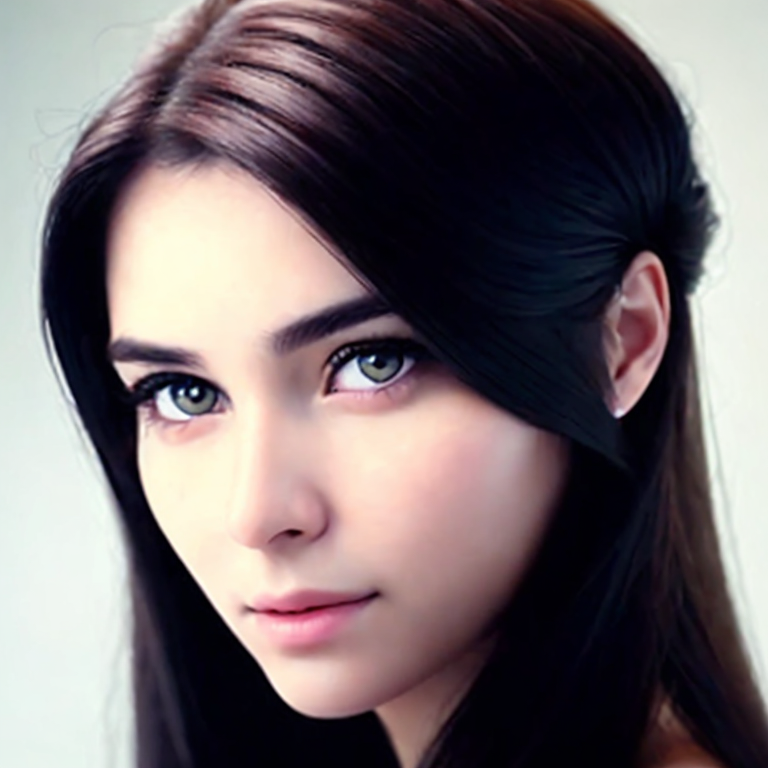

In [7]:
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo, "

prompt = """
a realistic photo of beautiful woman face
"""

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

img2image_3x = img2img_pipe(
    image = resized_raw_image
    , prompt = prompt
    , negative_prompt = neg_prompt
    , strength = 0.3
    , num_inference_steps = 80
    , guidance_scale = 8
    , generator = torch.Generator("cuda").manual_seed(1)
).images[0]
img2image_3x

In [8]:
# save the upscaled image
file_name_768x768 = f"input_images/{image_name}_768x768.png"
img2image_3x.save(file_name_768x768)

C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


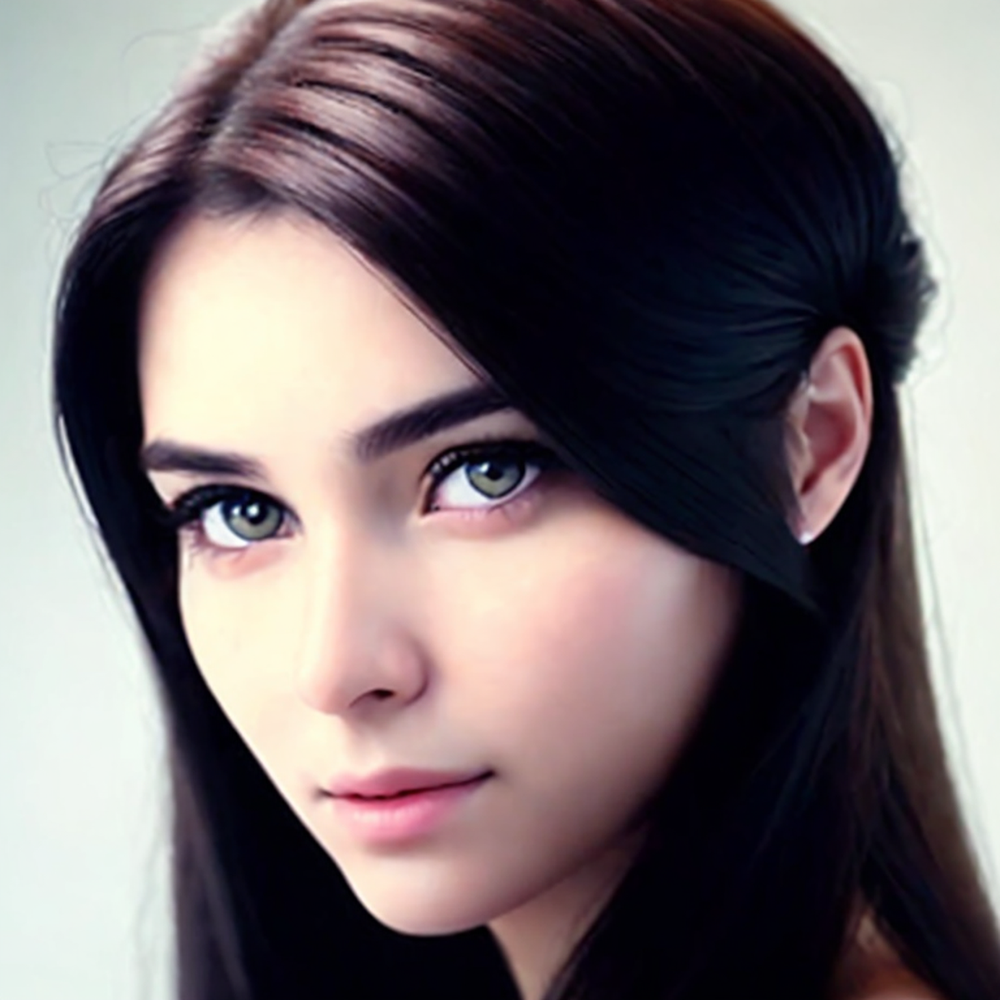

  0%|          | 0/24 [00:00<?, ?it/s]

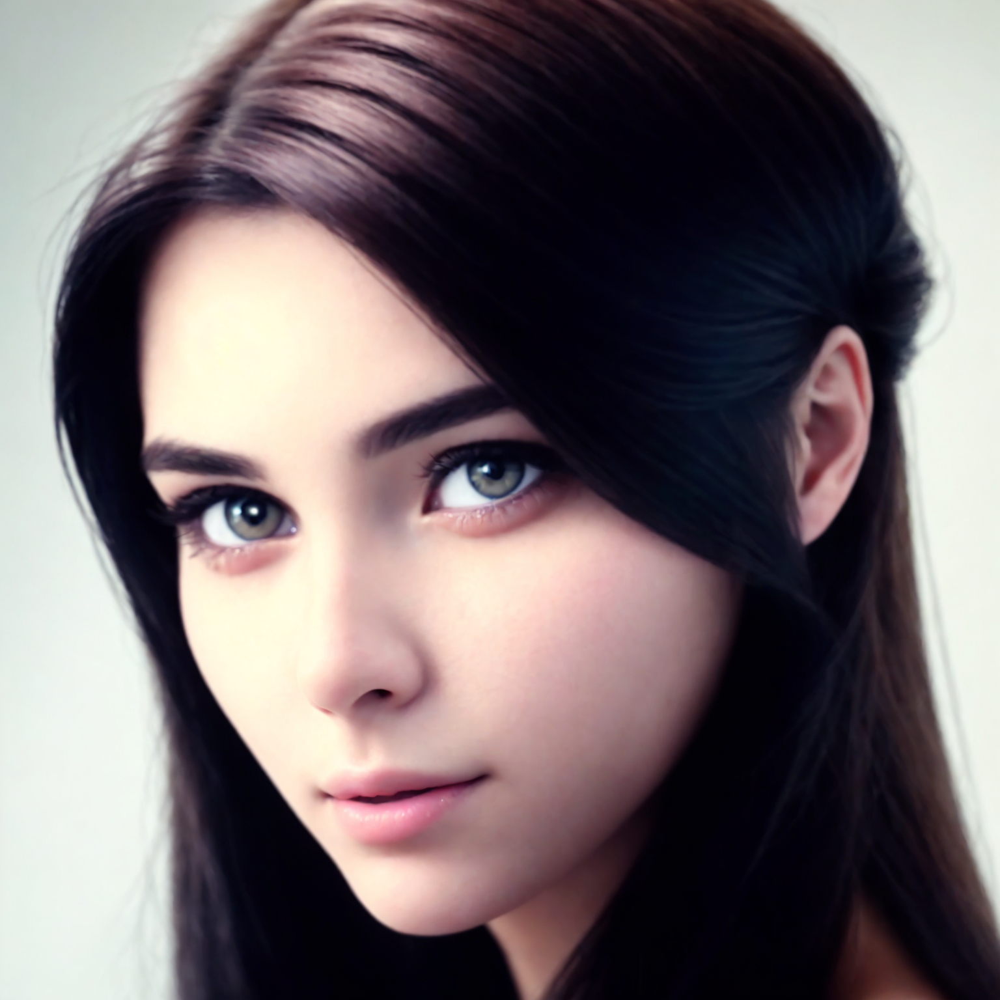

In [9]:
# further upscale 
resized_raw_image = resize_img(file_name_768x768, 2.0)
display(resized_raw_image)

sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"
prompt = """
a realistic photo of beautiful woman face
"""

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

img2image_6x = img2img_pipe(
    image = resized_raw_image
    , prompt = prompt
    , negative_prompt = neg_prompt
    , strength = 0.3
    , num_inference_steps = 80
    , guidance_scale = 7.5
    , generator = torch.Generator("cuda").manual_seed(1)
).images[0]
img2image_6x

In [10]:
# save the upscaled image
file_name_1024x1024 =  f"input_images/{image_name}_1536x1536.png"
img2image_6x.save(file_name_1024x1024)

## ControlNet Super Resolution

In [11]:
import torch
from diffusers import ControlNetModel

controlnet = ControlNetModel.from_pretrained(
    'takuma104/control_v11'
    , subfolder='control_v11f1e_sd15_tile'
    , torch_dtype=torch.float16
)

control_v11f1e_sd15_tile/config.json:   0%|          | 0.00/955 [00:00<?, ?B/s]

C:\Users\Asus\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\huggingface_hub\file_download.py:140: UserWarning: `huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Asus\.cache\huggingface\hub\models--takuma104--control_v11. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development
  warnings.warn(message)


diffusion_pytorch_model.safetensors:   0%|          | 0.00/723M [00:00<?, ?B/s]

In [12]:
# load controlnet tile
from diffusers import StableDiffusionControlNetImg2ImgPipeline 

# load checkpoint model with controlnet
pipeline = StableDiffusionControlNetImg2ImgPipeline.from_pretrained(
    "stablediffusionapi/deliberate-v2"
    , torch_dtype    = torch.float16
    , safety_checker = None
    , controlnet     = controlnet
)

print("model ready")

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet_img2img.StableDiffusionControlNetImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


model ready


C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


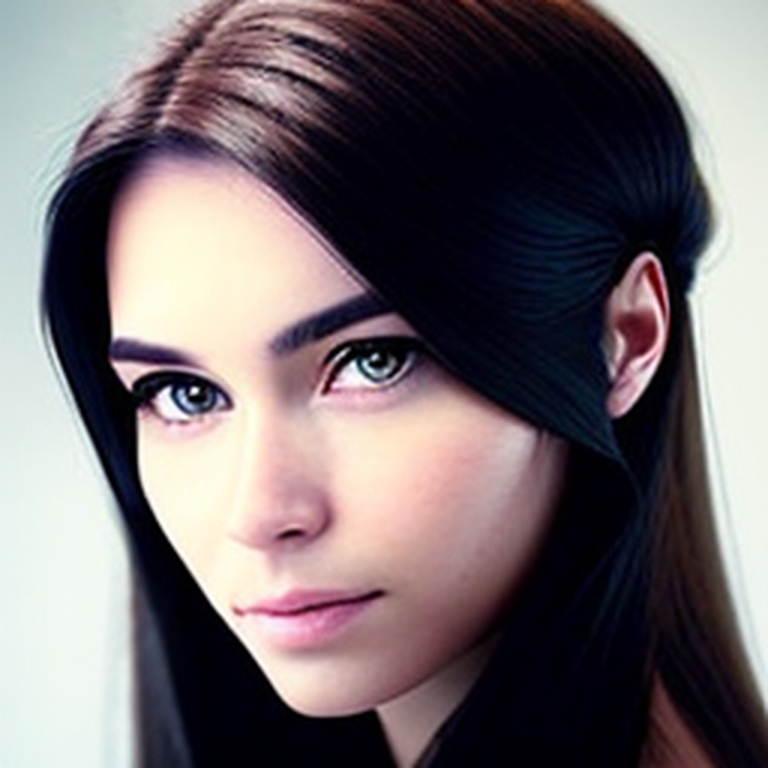

In [14]:
# load resized image
image_name = "woman_face"
file_name_256x256 = f"input_images/{image_name}_256x256.png"
resized_raw_image = resize_img(file_name_256x256, 3.0)
resized_raw_image

  0%|          | 0/40 [00:00<?, ?it/s]

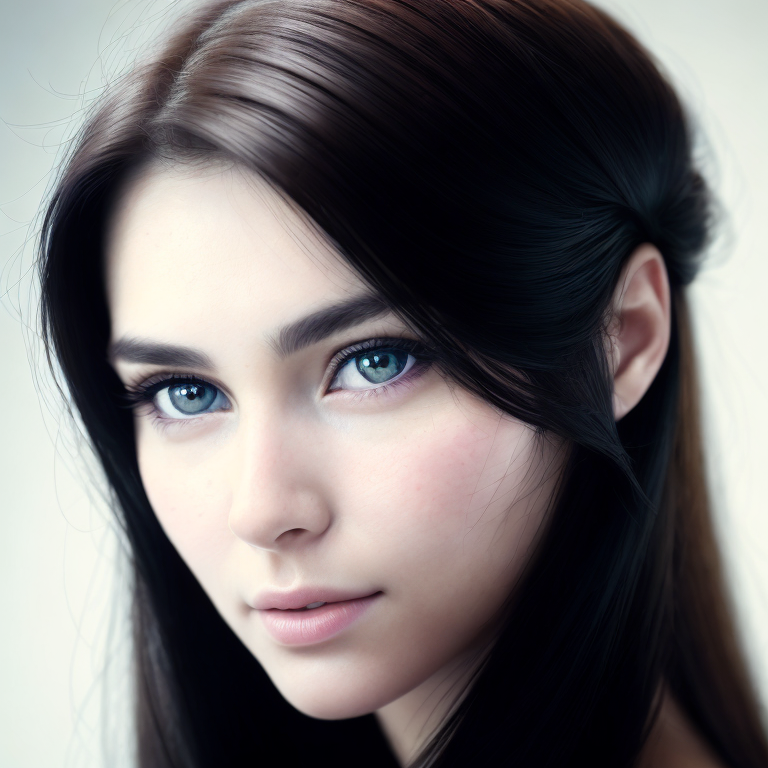

In [15]:
# upscale
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = """
a realistic photo of beautiful woman face
"""
prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"
pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

cn_tile_upscale_img

In [16]:
# save the upscaled image
file_name_tile =  f"input_images/{image_name}_1536x1536_tile.png"
cn_tile_upscale_img.save(file_name_tile)

## Additional ControlNet Tile Upscaling Samples

### Man face

  0%|          | 0/50 [00:00<?, ?it/s]

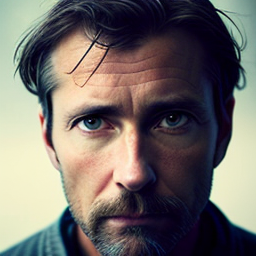

C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


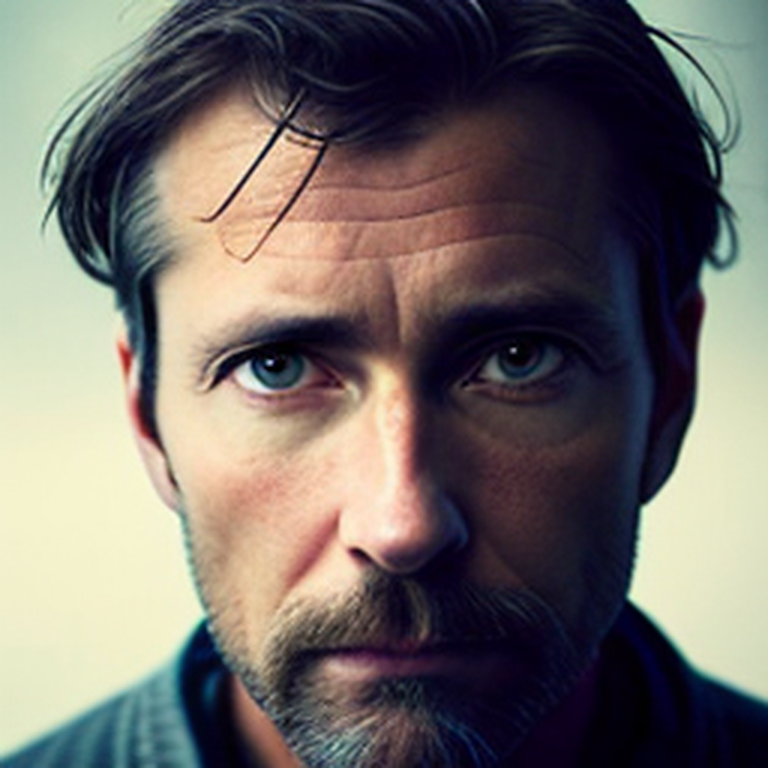

  0%|          | 0/40 [00:00<?, ?it/s]

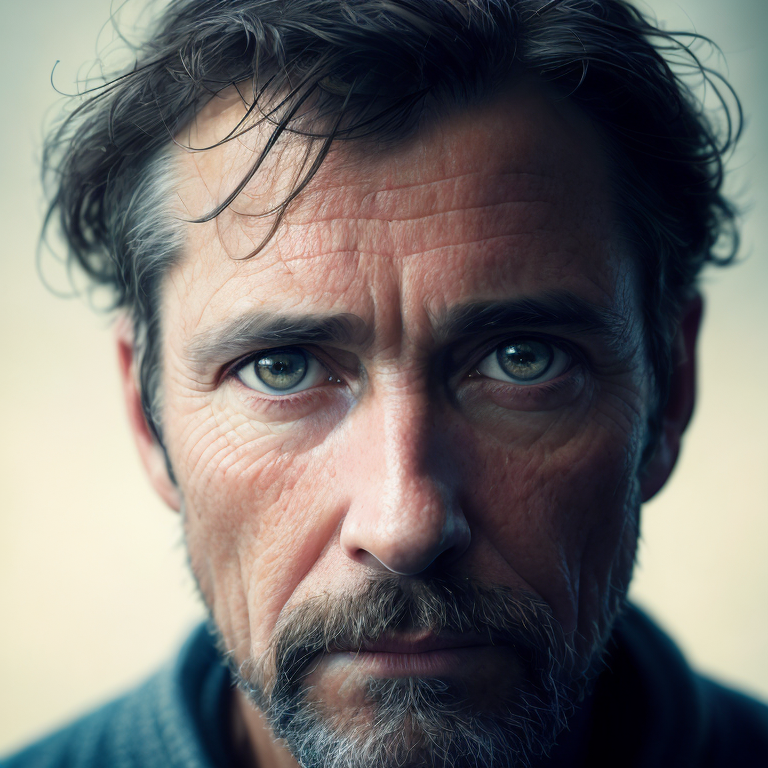

In [17]:
# step 1. generate an image
prompt = """
Raw, analog a portrait of an 43 y.o. man , 
beautiful photo with highly detailed face by greg rutkowski and magali villanueve
"""

neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(3)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"input_images/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
resized_raw_image = resize_img(file_name_256x256, 3.0)
display(resized_raw_image)

# step 3. upscale image
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

display(cn_tile_upscale_img)

### Old Man

  0%|          | 0/50 [00:00<?, ?it/s]

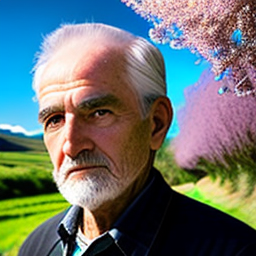

C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


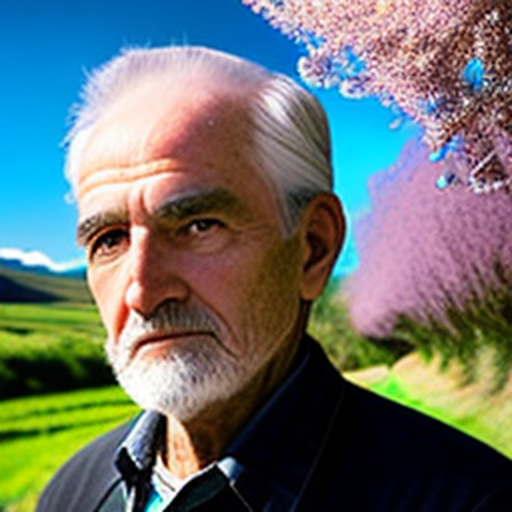

  0%|          | 0/40 [00:00<?, ?it/s]

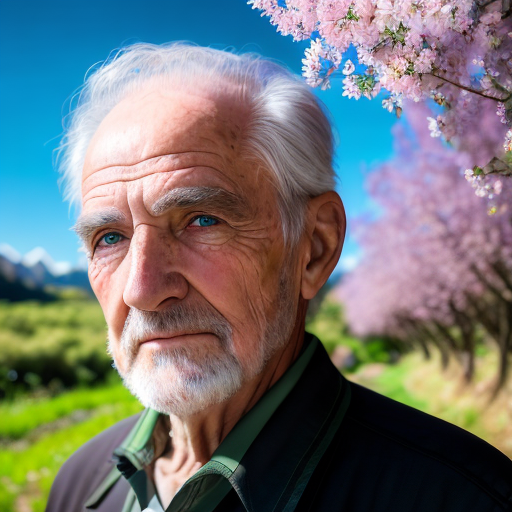

In [19]:
# step 1. generate an image
prompt = """
A realistic photo of an old man, standing in the gardon, flower and green trees around, face view
"""

neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(3)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"input_images/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
resized_raw_image = resize_img(file_name_256x256, 2.0)
display(resized_raw_image)

# step 3. upscale image
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

display(cn_tile_upscale_img)

### Royal female

  0%|          | 0/50 [00:00<?, ?it/s]

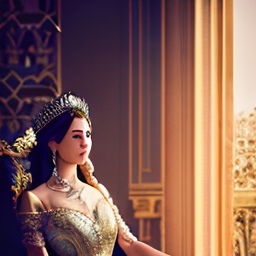

C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


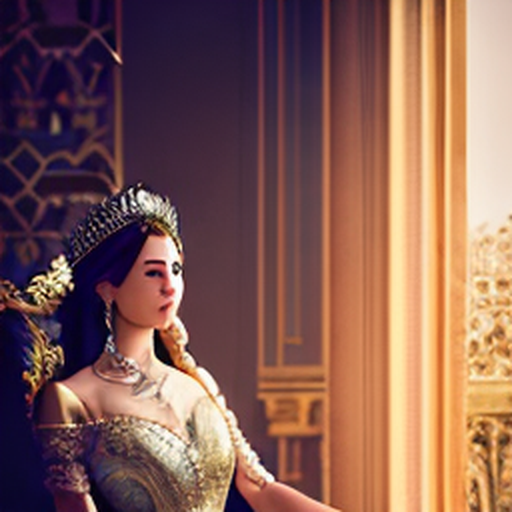

  0%|          | 0/40 [00:00<?, ?it/s]

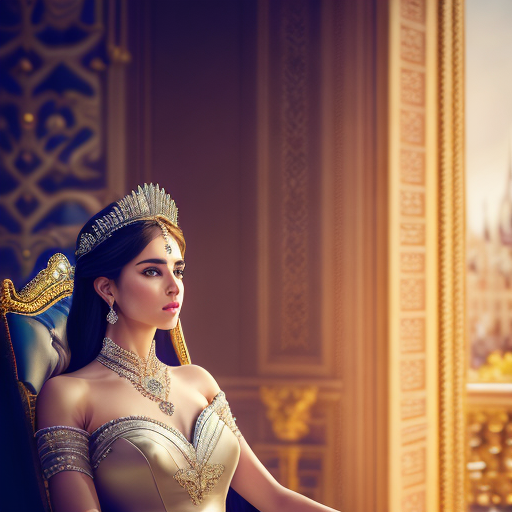

In [20]:
# step 1. generate an image
prompt = """
upper body photo of royal female, elegant, pretty face, majestic dress, 
sitting on a majestic chair, in a grand fantasy castle hall, shallow depth of field, cinematic lighting, Nikon D850,
film still, HDR, 8k
"""

neg_prompt = "NSFW, bad anatomy"

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(7)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"input_images/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
resized_raw_image = resize_img(file_name_256x256, 2.0)
display(resized_raw_image)

# step 3. upscale image
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

neg_prompt = "worst quality, low quality, lowres, bad anatomy"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.8
    , guidance_scale                = 7
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    #, controlnet_conditioning_scale = 0.8
).images[0]

display(cn_tile_upscale_img)

  0%|          | 0/50 [00:00<?, ?it/s]

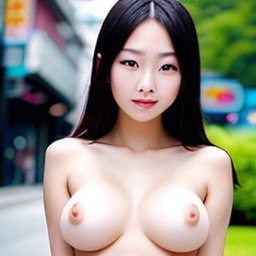

C:\Users\Asus\AppData\Local\Temp\ipykernel_13976\2783063681.py:20: DeprecationWarning: LANCZOS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  ,resample = Image.LANCZOS if upscale_times > 1 else Image.AREA


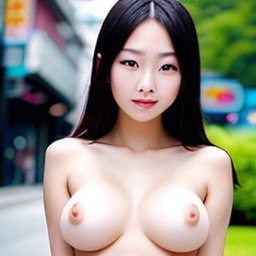

Token indices sequence length is longer than the specified maximum sequence length for this model (98 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['1 . 5 ), she proudly show her beautiful body , she has slim body and porcelain skin symmetric breasts']


  0%|          | 0/25 [00:00<?, ?it/s]

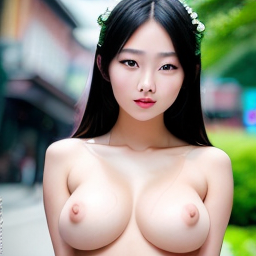

In [21]:
# step 1. generate an image
# prompt = """
# one middle aged woman left, hitler in right
# """

prompt = """
taiwan pop idol, RAW photo, best quality, realistic,photo, best quality ,masterpiece,
extremely detailed sexy 1girl stand on street, she is amazingly beautiful and attractive
, (perky breasts:1.5), (show breasts, show perfect nipples:1.5),
she proudly show her beautiful body, she has slim body and porcelain skin
symmetric breasts
"""

#neg_prompt = "worst quality, low quality, lowres, bad anatomy"

neg_prompt = """
paintings, 3d, cg, sketches, worst quality, low quality, normal quality
, lowres, extra fingers, fewer fingers, blur, bad anatomy
"""

text2img_pipe.to("cuda")
raw_image = text2img_pipe(
    prompt = prompt
    , negative_prompt = neg_prompt
    , height = 256
    , width = 256
    , generator = torch.Generator("cuda").manual_seed(7)
).images[0]
display(raw_image)

image_name = "man"
file_name_256x256 = f"input_images/{image_name}_256x256.png"
raw_image.save(file_name_256x256)

# step 2. resize image
# resized_raw_image = resize_img(r"D:\az_git_folder\azcode\az_projects\stable_diffusion_book\book_content\chapter_11_image_restore_and_super_resolution\input_images\girl.png", 1.01)
resized_raw_image = resize_img(file_name_256x256, 1.01)
display(resized_raw_image)

# from diffusers.utils import load_image
# img_path = r"D:\az_git_folder\azcode\az_projects\stable_diffusion_book\book_content\chapter_11_image_restore_and_super_resolution\input_images\girl.png"
# resized_raw_image = load_image(img_path)

# step 3. upscale image
sr_prompt = "8k, best quality, masterpiece, realistic, photo-realistic, ultra detailed, sharp focus, raw photo,"

prompt = f"{sr_prompt}{prompt}"

sr_neg_prompt = "worst quality, low quality, lowres, bad anatomy, blurry, blur"
neg_prompt = f"{sr_neg_prompt} {neg_prompt}"

pipeline.to("cuda")
cn_tile_upscale_img = pipeline(
    image                           = resized_raw_image
    , control_image                 = resized_raw_image
    , prompt                        = prompt
    , negative_prompt               = neg_prompt
    , strength                      = 0.5
    , guidance_scale                = 8
    , generator                     = torch.Generator("cuda")
    , num_inference_steps           = 50
    , controlnet_conditioning_scale = 0.5
).images[0]

display(cn_tile_upscale_img)

In [14]:
cn_tile_upscale_img.save("input_images/iron_man_15x.png")